In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator
from scipy.signal import find_peaks


from readmultispec import * #permet de lire les fichiers fits de spectre à échelle
from wavelen_work import * #permet de traiter les spectres synthétiques et de zoomer sur différentes parties du spectres
from zoom_raies import * #permet de zoomer sur les raies demandées avec les spectres synthétiques demandés


In [2]:
#pour le design des plot
import matplotlib.font_manager

plt.rcParams['font.family'] = 'serif'
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'
plt.rcParams['xtick.top'] = True
plt.rcParams['xtick.bottom'] = True
plt.rcParams['ytick.left'] = True
plt.rcParams['ytick.right'] = True
plt.rcParams['xtick.major.width'] = 0.5
plt.rcParams['xtick.minor.width'] = 0.5
plt.rcParams['ytick.major.width'] = 0.5
plt.rcParams['ytick.minor.width'] = 0.5


# Stage IR

IGRINS Ba/S data. 24 spectres dans bande H (1.5 - 1.75 µm)et K (2.05 - 2.3 µm)

*Correction Sneden : multi-order reduced spectrum in H, wavelengths shifted to air, telluric-corrected with the IGRINS pipeline (that is, by magic, although the spectra look reasonably clean), and with the worst noise spikes removed. mild division of the spectra by one spline continuum fit (IRAF "continuum") so that the top of the spectra are near to 1.0, but certainly not exactly that.* 

# BD-22 1742

In [3]:
starname = "BD-221742" # nom de l'étoile
starnameb = "BD-221742b" # même étoile, mais normalisation du continu différente 

In [4]:
# lecture des spectres fichiers .fits
read_spec_h = readmultispec("/Users/margauxvandererven/Documents/unif2023-2024/spectre_IR/spectra/H_Sneden/"+starname+"H.cont.fits")
read_spec_k = readmultispec("/Users/margauxvandererven/Documents/unif2023-2024/spectre_IR/spectra/K_Sneden/"+starname+"K.cont.fits")

stardata = {
    "starname"  : starname,
    "wavelen_h" : list(read_spec_h['wavelen']),
    "flux_h" : read_spec_h['flux'], 
    "wavelen_k" : list(read_spec_k['wavelen']), 
    "flux_k" : read_spec_k['flux'], 
    "v" : 176.8 * 1e3 # redshift déterminé pour la bande H
}

stardata_K = {
    "starname"  : starname,
    "wavelen_h" : list(read_spec_h['wavelen']),
    "flux_h" : read_spec_h['flux'], 
    "wavelen_k" : list(read_spec_k['wavelen']), 
    "flux_k" : read_spec_k['flux'], 
    "v" : 177.5* 1e3 # redshift déterminé pour la bande K
}

read_spec_h_b = readmultispec("/Users/margauxvandererven/Documents/unif2023-2024/spectre_IR/spectra/H_Sneden/"+starnameb+"H.cont.fits")
read_spec_k_b = readmultispec("/Users/margauxvandererven/Documents/unif2023-2024/spectre_IR/spectra/K_Sneden/"+starnameb+"K.cont.fits")

stardatab = {
    "starname"  : starnameb,
    "wavelen_h" : list(read_spec_h_b['wavelen']),
    "flux_h" : read_spec_h_b['flux'], 
    "wavelen_k" : list(read_spec_k_b['wavelen']), 
    "flux_k" : read_spec_k_b['flux'], 
    # "v" : v
}

Dispersion is linear
Dispersion is linear
Dispersion is linear
Dispersion is linear


### Paramètres stellaires :  
  
- Teff = 4000 K  
- L = 775 $L_ⵙ$  
- log g = 1  
- [Fe/H] = -0.3  
- M = 2 $M_ⵙ$  

### Spectre synthétique

Modèle : 4000g1.0z-0.50m1.0t02a+0.20c+0.346n+0.00o+0.20r+0.00s+0.00

## Spectres

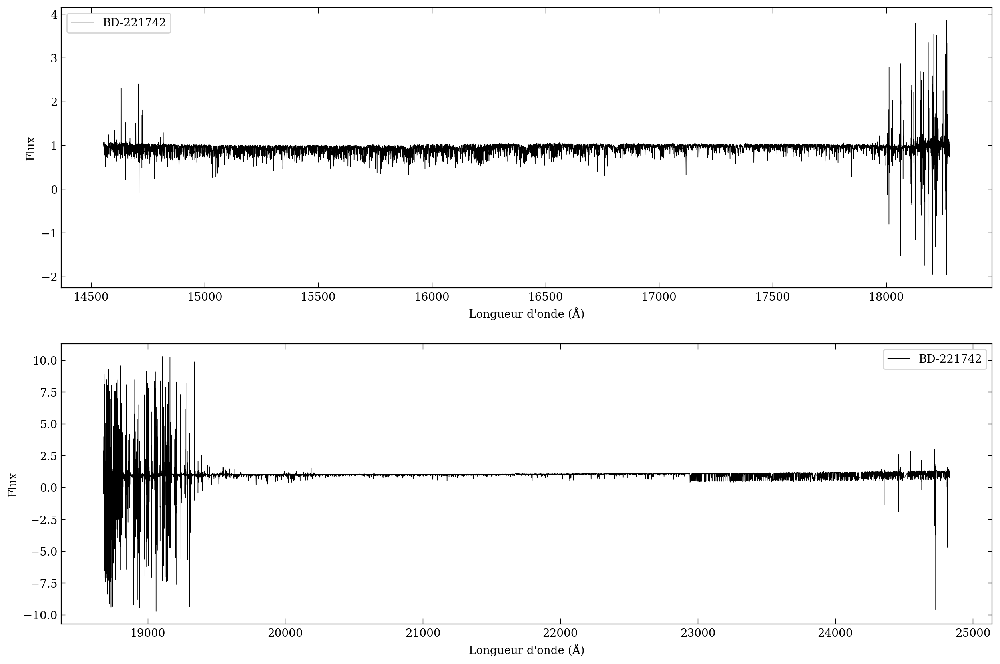

In [5]:
f = plt.figure(figsize=(15, 10), dpi = 200)
gs = f.add_gridspec(2, hspace=0.2)
(ax1, ax2) = gs.subplots(sharex=False, sharey=False)

ax1.plot(stardata.get("wavelen_h"), stardata.get("flux_h"), linewidth=0.5, color = 'black', label = starname)
ax2.plot(stardata.get("wavelen_k"), stardata.get("flux_k"), linewidth=0.5, color = 'black', label = starname)

ax1.legend()
ax2.legend()

for ax in f.get_axes():
    ax.set(xlabel="Longueur d'onde (Å)", ylabel="Flux")
    ax.xaxis.set_tick_params(direction = 'in', length = 5, which = 'major')
    ax.xaxis.set_tick_params(direction = 'in', length = 2, which = 'minor')


plt.rcParams['pgf.texsystem'] = 'pdflatex' 

# plt.savefig('/Users/margauxvandererven/Documents/unif2023-2024/spectre_IR/rapport/figures/graph.pgf')


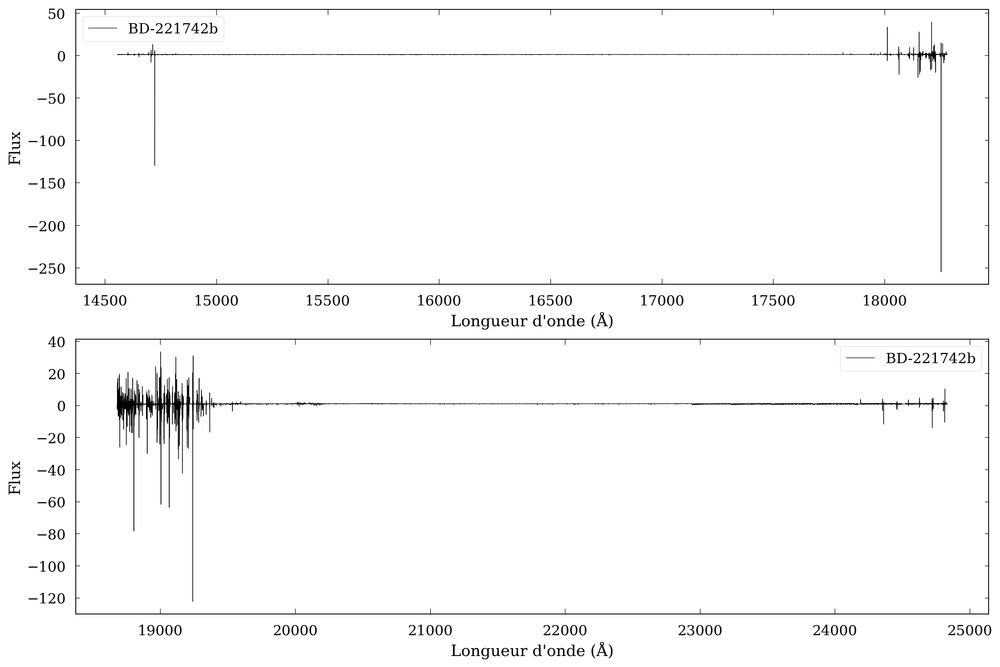

In [7]:
f = plt.figure(figsize=(15, 10), dpi = 200)
gs = f.add_gridspec(2, hspace=0.2)
(ax1, ax2) = gs.subplots(sharex=False, sharey=False)

ax1.plot(stardatab.get("wavelen_h"), stardatab.get("flux_h"), linewidth=0.5, color = 'black', label = starnameb)
ax2.plot(stardatab.get("wavelen_k"), stardatab.get("flux_k"), linewidth=0.5, color = 'black', label = starnameb)

ax1.legend()
ax2.legend()

for ax in f.get_axes():
    ax.set(xlabel="Longueur d'onde (Å)", ylabel="Flux")
    ax.xaxis.set_tick_params(direction = 'in', length = 5, which = 'major')
    ax.xaxis.set_tick_params(direction = 'in', length = 2, which = 'minor')

## Synthèse

Si nous voulons couvrir la bande H et K entièrement, nous devons effectuer 3 synthèses par souci de taille de calcul de Turbospectrum. Nous effectuons 

une synthèse de 14500 Å à 18500 Å, une seconde de 18500 Å à 22500 Å et une dernière de 22500 Å à 25000 Å.

In [6]:
path = "/Users/margauxvandererven/Desktop/syntspec/"+starname+"b/" # chemin vers le dossier des spectres synthétiques

### Molécules

Dans cette section, nous calculons la différence entre le flux de la synthèse atomique + une molécule et le flux de la synthèse atomique simple. Nous 

tracons cette différence à partir du continu afin d'observer la contribution des molécules sur le spectre. 

In [8]:
filename = "atomic_simple" # spectre synthétique avec seulement les raies atomiques
filename2 = "12C14N"  # spectre synthétique avec à la foie les raies atomiques et celle de la molécule analysée

In [9]:
flux  = syntspec(path+filename)['flux'] # récupération du flux
fluxb = syntspec(path+filename2)['flux']
diff = [1 - (flux[i] - fluxb[i]) for i in range(len(flux))][7000:-45000] # différence entre les deux synthèses pour la bande H

flux2  = syntspec(path+filename+"2")['flux']
fluxb2 = syntspec(path+filename2+"2")['flux']
diff2 = [1 - (flux2[i] - fluxb2[i]) for i in range(len(flux2)) ][26000:] # différence entre les deux synthèses pour la première partie de la bande K

flux3  = syntspec(path+filename+"3")['flux']
fluxb3 = syntspec(path+filename2+"3")['flux']
diff3 = [1 - (flux3[i] - fluxb3[i]) for i in range(len(flux3)) ][:-130000] # différence entre les deux synthèses pour la deuxième partie de la bande K

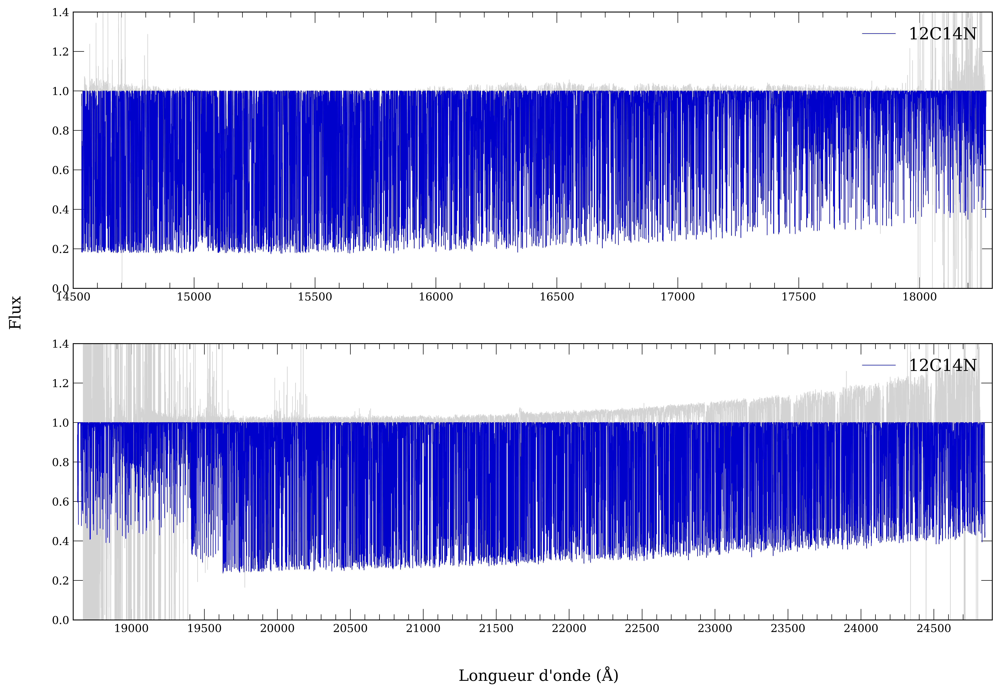

In [10]:
f = plt.figure(figsize=(15, 10), dpi = 600)
gs = f.add_gridspec(2, hspace=0.2)
(ax1, ax2) = gs.subplots(sharex=False, sharey=False)

ax1.plot(redshift_wavelen(stardata.get("wavelen_h"), stardata.get("v")), stardata.get("flux_h"), linewidth=0.5, color = 'lightgray')
ax1.plot(syntspec(path+filename2)['wavelen'][7000:-45000], diff, linewidth=0.5, color = 'mediumblue', label = filename2)

ax2.plot(redshift_wavelen(stardata.get("wavelen_k"), stardata.get("v")), stardata.get("flux_k"), linewidth=0.5, color = 'lightgray')
ax2.plot(syntspec(path+filename2+"2")['wavelen'][26000:], diff2, linewidth=0.5, color = 'mediumblue', label = filename2)
ax2.plot(syntspec(path+filename2+"3")['wavelen'][:-130000], diff3, linewidth=0.5, color = 'mediumblue')

ax1.set_xlim(14500,18300)
ax2.set_xlim(18600,24900)

f.text(0.07, 0.50, 'Flux', va='center', rotation='vertical', fontsize=14)
f.text(0.45, 0.04, "Longueur d'onde (Å)", va='center', fontsize=14)

for ax in f.get_axes():
    ax.legend(loc = 'upper right', frameon=False, fontsize = 15)
    # ax.set(xlabel="Longueur d'onde (Å)", ylabel="Flux")
    ax.set_ylim(0.0,1.4)
    ax.xaxis.set_major_locator(MultipleLocator(500))
    ax.xaxis.set_minor_locator(MultipleLocator(100))
    ax.xaxis.set_tick_params(direction = 'in', length = 10, which = 'major')
    ax.yaxis.set_tick_params(direction = 'in', length = 10, which = 'major')
    ax.xaxis.set_tick_params(direction = 'in', length = 5, which = 'minor')


plt.savefig("/Users/margauxvandererven/Documents/unif2023-2024/spectre_IR/rapport/contribution_mol/"+filename2, bbox_inches="tight", pad_inches=0.1)

In [11]:
print("bande H : ",(1-min(diff))*100) # maximum d'absorption due à la présence de la molécule en pourcent dans la bande H
print("bande K : ",(1-min(diff2))*100, (1-min(diff3))*100) # maximum d'absorption due à la présence de la molécule en pourcent dans la bande K

bande H :  82.468
bande K :  76.327 70.02189999999999


## Sélection de raies

In [12]:
# longueurs d'onde des raies de Nandakumar et al. 2024
lines = {
    # "S": [15478.48, 22507.60],
    # "Na": [16373.87 , 16388.85 , 22056.43 , 22083.66  , 23379.14],
    # "Al": [16718.97 ,
    #         16750.60 , 16763.37 , 17699.05 ,
    #  21093.08 , 21163.80 , 21208.18
    # ], 
    # "Zn": [16505.18],
    # "Si": [16434.93, 20804.20 , 20890.37  , 20926.14],
    "K": [15163.09 , 15168.40],
    # "Ca": [16150.76 , 16155.24 , 16157.36 ,  20962.57 , 20972.53 , 21113.90 , 22607.94 , 22624.96 , 22626.72 , 22651.18 , 22653.58],
    # "Sc": [21730.36 , 21812.24 , 21842.70],
    # "Ti": [16330.54 , 21149.62],
    # "V": [15924.81],
    # "Cr": [15680.06 , 15860.21 , 17708.73 ], 
    # "Mn": [15217.74 , 15262.49],
    # "Co": [16757.64],
    # "Ni": [16310.50 , 16363.09 , 16815.46 , 16818.74 , 16867.28 , 17306.52 , 20957.14 , 21167.93 , 21570.06 , 21945.50 , 22596.93 ],
    # "Cu": [16005.64, 16638.98], 
    # "Zn": [16505.18],
    # "Y": [21260.45 , 22543.84],
    # "Ce": [15277.65 , 15829.83 , 15977.12 , 16595.18],
    # "Nd": [15368.14 , 16053.63 , 16262.04],
    # "Yb": [16498.40],
    # "F": [22699.49 , 22714.59 ,  22778.25 , 22826.86 , 22886.73 , 22957.94],
    # "Mg" : [21059.76, 21060.89, 21458.87]
}

In [13]:
# spectres synthétiques
synthetics = [
    "btotal", "total", 
            #   "tot_Ce", "tot_O", "MAC-6"
              ]
molecules = ["12C14N","12C16O", "13C14N", "16OH", "56FeH", "12CH","12C12C","12C13C", "13C13C","HF"]
# zoom_lines(path, filename, molecules, stardata, 5)

In [14]:
# raies de molécules identifiées 

lines_mol = {
    # "12C12C": [15282.83], #Ce
    # "12C14N" : [15268.55, 15272.55],  # Ce
    # "12C12C": [15483.99], #S
    # "12C14N" : [15481.85, 15473.3] #S
    "12C16O" : [16765.85], #Al
    "12C14N" : [16754.43, 16770.45] #Al
}

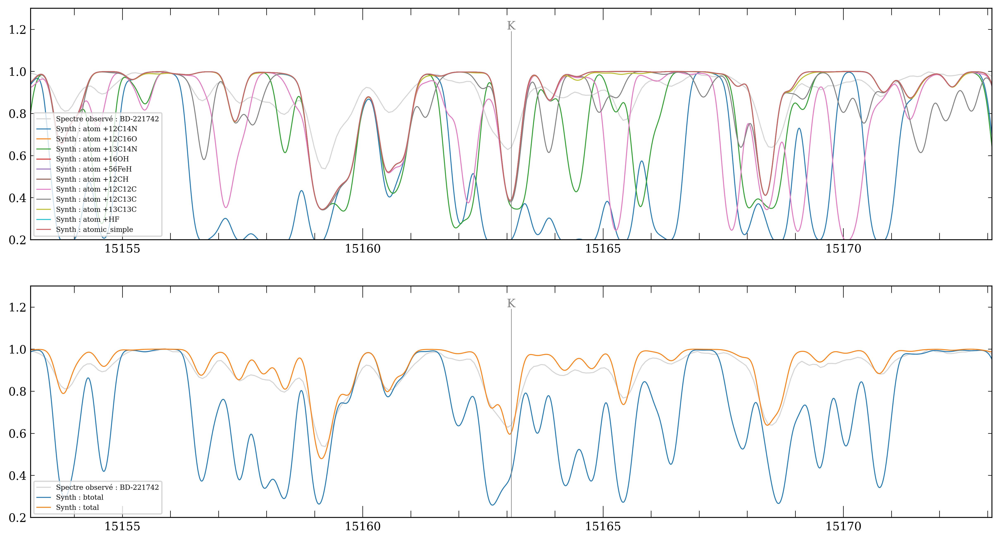

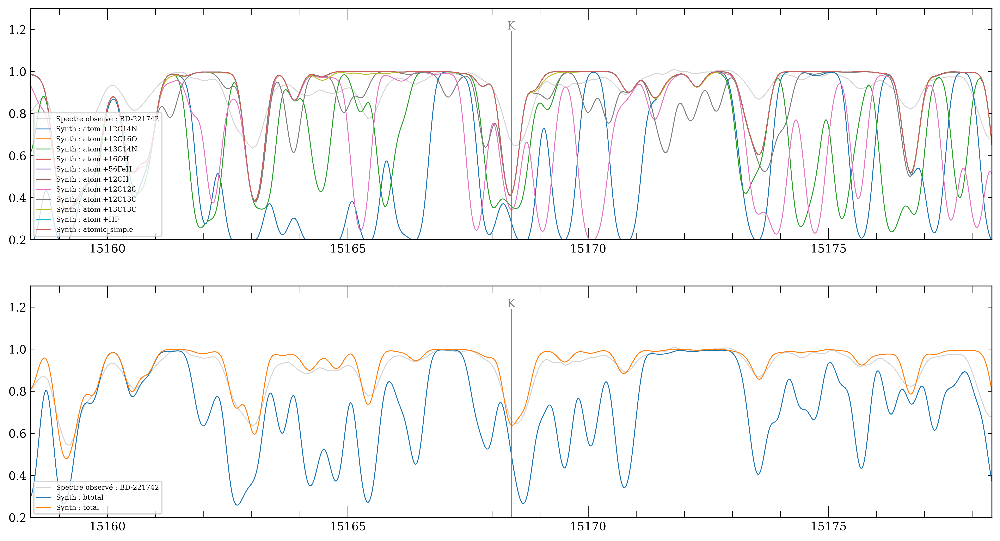

In [15]:
lines_analyse(lines,path, filename,synthetics, molecules, stardata)

## Détermination des abondances CNO

Dans cette section, nous essayons d'identifier des raies de molécules afin de pouvoir déterminer l'abondance du C, N et O.

In [13]:
i = "" # "" ou "2" ou "3", pour respectivement, la synthèse de la bande H, la première synthèse de la bande K, la deuxième synthèse de la bande K
m = "h" # bande H ou K

In [37]:
k = 16763.37 # longueur d'onde d'intérêt 
name = "Al" # éléments d'intérêt 
nom = "molecules3"

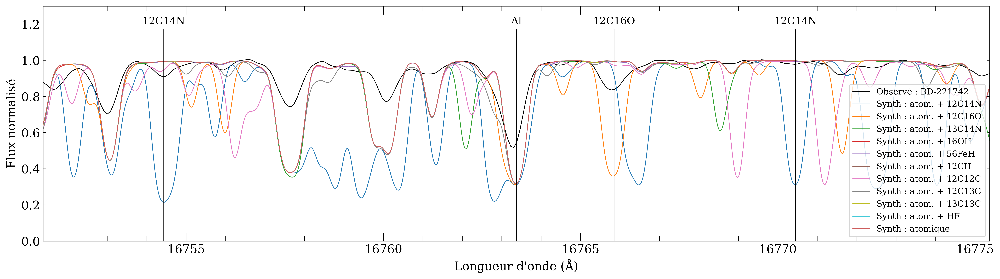

In [38]:
f = plt.figure(figsize=(20,5), dpi = 600)
gs = f.add_gridspec(1, hspace=0.2)
ax = gs.subplots(sharex=False, sharey=True)


AX = syntspec(path+filename)
AX2 = syntspec(path+"total")
normal = normalisation(redshift_wavelen(stardata.get("wavelen_" + m), 177.5 * 1e3),stardata.get("flux_" + m),k)

# ax.plot(redshift_wavelen(stardata.get("wavelen_" + m), stardata.get("v")), stardata.get("flux_" + m), linewidth=0.8, color='lightgray', label="Spectre observé : " + stardata.get("starname"))
ax.plot(normal['z_wavelen'],normal['flux_normalised'], linewidth=0.8, color='black', label="Observé : " + stardata.get("starname"))

for mol in molecules:
        AXb = syntspec(path + str(mol))
        ax.plot(AXb['wavelen'], AXb['flux'], label="Synth : atom. + "+mol, linewidth=0.8)

ax.plot(AX['wavelen'], AX['flux'], label="Synth : atomique",color = "indianred", linewidth=0.8)


ax.set_xlim(k-12,k+12)

for ax in f.get_axes(): 
    ax.xaxis.set_major_locator(MultipleLocator(5))
    ax.xaxis.set_minor_locator(MultipleLocator(1))
    ax.xaxis.set_tick_params(direction = 'in', length = 10, which = 'major')
    ax.xaxis.set_tick_params(direction = 'in', length = 6, which = 'minor')
    ax.tick_params(axis = 'both', labelsize = 14)
    ax.set_ylim(0., 1.3)
    ax.set_ylabel("Flux normalisé", fontsize = 14)
    ax.set_xlabel("Longueur d'onde (Å)", fontsize = 14)
    ax.axvline(x=k, ymin=0., ymax=0.9, color='black',  linewidth = 0.5)  # Ajoute la barre verticale à la position 'zoom'
    ax.text(k, 1.2, s = name, color='black', fontsize=12, ha='center') # Ajoute le nom au-dessus de la barre
    ax.legend(loc ='lower right')
    
for d in list(lines_mol.keys()):
        # print(d)
        t = lines_mol.get(d)
        # print(t)
        for q in t : 
                # print(q)
                ax.axvline(x=q, ymin=0., ymax=0.9, color='black',  linewidth = 0.5)  # Ajoute la barre verticale à la position 'zoom
                ax.text(q, 1.2, s = d, color='black', fontsize=12, ha='center')  # Ajoute le nom au-dessus de la barre

plt.savefig("/Users/margauxvandererven/Documents/unif2023-2024/spectre_IR/rapport/figures/"+nom, bbox_inches="tight", pad_inches=0.1)

In [30]:
def zoom_lines_analyse_ABU(path, lines_mol, synthetics, ABU, stardata, m, k, atom) : 
    """
    Fonction permettant de tracer un zoom (sur +-10 Å de chaque coté de la longueur d'onde "k") 
    des différents spectres synthétiques (avec des abondances différentes de C, N, O). 
    Ces spectres sont superposé au spectre observé de l'étoile. 

    - "path" : chemin où se trouve les fichiers synthétiques
    - "lines_mol" : longueurs d'onde des raies moléculaires
    - "synthetics" : spectres synthétiques
    - "ABU" : abondances tracées
    - "stardata" : dictionnaire contenant les informations nécessaires de l'étoile
    - "m" : soit "k" ou "h", dépendant dans quelle bande nous tracons le spectre
    - "k" : longueur d'onde sur laquelle se centre le zoom
    - "atom" : "C", "N" ou "O", dépendant de l'atome étudié
    """
    normal = normalisation(redshift_wavelen(stardata.get("wavelen_" + m), stardata.get("v")),stardata.get("flux_" + m),k)

    f = plt.figure(figsize=(20,5), dpi = 600)
    gs = f.add_gridspec(1, hspace=0.2)
    ax = gs.subplots(sharex=False, sharey=True)

    ax.set_xlim(k-11,k+11)
    # ax[1].set_xlim(k-4,k+4)

    ax.plot(normal['z_wavelen'], normal['flux_normalised'], linewidth=0.8, color='black', label="Observé : " + stardata.get("starname"))

    for synth in range(len(synthetics)) : 
        AX2 = syntspec(path+synthetics[synth])
        ax.plot(AX2['wavelen'], AX2['flux'], label = "Synth : log $\epsilon_{" + atom + "}= "+ ABU[synth] +"$", linewidth = 0.8)
    
    ax.xaxis.set_major_locator(MultipleLocator(5))
    ax.xaxis.set_minor_locator(MultipleLocator(1))
    ax.xaxis.set_tick_params(direction = 'in', length = 10, which = 'major')
    ax.xaxis.set_tick_params(direction = 'in', length = 6, which = 'minor')
    ax.set_ylim(0., 1.3)
    ax.tick_params(axis = 'both', labelsize = 14)
    ax.axvline(x=k, ymin=0., ymax=0.9, color='black',  linewidth = 0.5)  # Ajoute la barre verticale à la position 'zoom'
    ax.text(k, 1.2, s = name, color='black', fontsize=12, ha='center')  # Ajoute le nom au-dessus de la barre
    ax.legend(loc = "lower left", fontsize = 12)
    ax.set_xlabel("Longueur d'onde (Å)", fontsize = 14)
    ax.set_ylabel("Flux normalisé",fontsize = 14)
    
    for d in list(lines_mol.keys()):
        t = lines_mol.get(d)
        for q in t:
            ax.axvline(x=q, ymin=0., ymax=0.9, color='black',  linewidth = 0.5)  # Ajoute la barre verticale à la position 'zoom'
            ax.text(q, 1.2, s = d, color='black', fontsize=12, ha='center')  # Ajoute le nom au-dessus de la barre

    plt.savefig("/Users/margauxvandererven/Documents/unif2023-2024/spectre_IR/rapport/figures/"+atom+"abu_"+name, bbox_inches="tight", pad_inches=0.1)

In [39]:
synthetics_ABU = ["O_Al_9.2", "O_Al_9.3", "O_Al_9.11", "O_Al_8.00", "O_Al_8.50"]
ABU = ["9.20", "9.30", "9.11", "8.00", "8.50"]

In [26]:
synthetics_ABU = ["N_Ce_9.15", "N_Ce_8.00", "N_Ce_7.8"]
ABU = ["9.15", "8.00", "7.80"]

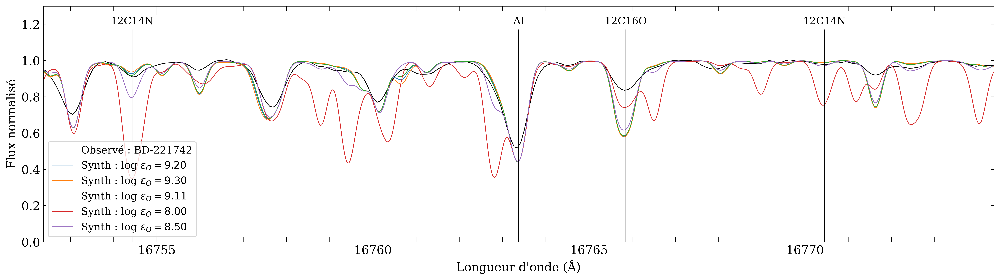

In [40]:
zoom_lines_analyse_ABU(path,lines_mol, synthetics_ABU, ABU, stardata, m, k, "O")

In [188]:
def zoom_lines_analyse_ABU_zoom(path, synthetics, ABU, stardata, m, k, i, taille) : 
    """
    Fonction permettant de tracer deux zooms (de +-7 Å et 4 Å de chaque coté de la longueur d'onde "k") 
    des différents spectres synthétiques (avec des abondances différentes de C, N, O). 
    Ces spectres sont superposé au spectre observé de l'étoile. 

    - "path" : chemin où se trouve les fichiers synthétiques
    - "synthetics" : spectres synthétiques
    - "ABU" : abondances tracées
    - "stardata" : dictionnaire contenant les informations nécessaires de l'étoile
    - "m" : soit "k" ou "h", dépendant dans quelle bande nous tracons le spectre
    - "k" : longueur d'onde sur laquelle se centre le zoom
    - "i" : nom de la molécule
    - "taille" : taille de la zone où s'effectue le chi carré
    """

    normal = normalisation(redshift_wavelen(stardata.get("wavelen_" + m), stardata.get("v")),stardata.get("flux_" + m),k)

    f = plt.figure(figsize=(15,8), dpi = 400)
    gs = f.add_gridspec(2, hspace=0.2)
    ax = gs.subplots(sharex=False, sharey=True)

    ax[0].set_xlim(k-7,k+7)
    ax[1].set_xlim(k-4,k+4)

    for ax in ax :
        ax.plot(normal['z_wavelen'], normal['flux_normalised'], linewidth=0.8, color='gray', label="Spectre observé : " + stardata.get("starname"))

        for synth in range(len(synthetics)) : 
            AX2 = syntspec(path+synthetics[synth])
            ax.plot(AX2['wavelen'], AX2['flux'], label = "Synth : log $\epsilon_N$ = "+ ABU[synth], linewidth = 0.8)
        
        ax.xaxis.set_major_locator(MultipleLocator(5))
        ax.xaxis.set_minor_locator(MultipleLocator(1))
        ax.xaxis.set_tick_params(direction = 'in', length = 10, which = 'major')
        ax.xaxis.set_tick_params(direction = 'in', length = 6, which = 'minor')
        ax.set_ylim(0.2, 1.3)
        ax.tick_params(axis = 'both', labelsize = 14)
        ax.axvline(x=k, ymin=0., ymax=0.9, color='gray',  linewidth = 0.5)  # Ajoute la barre verticale à la position 'zoom'
        ax.text(k, 1.2, s = i, color='gray', fontsize=12, ha='center')  # Ajoute le nom au-dessus de la barre
        ax.legend(loc = "lower left", fontsize = 10)
        ax.axvspan(k-taille, k+taille, color='bisque', alpha=0.5)
        ax.set_xlabel("Longueur d'onde (Å)", fontsize  = 14)
        ax.set_ylabel("Flux normalisé", fontsize  = 14)

    

In [41]:
def chi_squared(synth, observed):
    return np.sum((synth - observed)**2 / observed)

def chi_MAC(path, synthetics,MAC, stardata, j, k, taille): 
    """
    Fonction qui returne le chi carré pour différentesn synthèses "synthetics"
    """
    l = int(taille/0.005)
    normal = normalisation2(redshift_wavelen(stardata.get("wavelen_"+j), stardata.get("v")),stardata.get("flux_"+j),k,l)

    observed = np.array(normal['flux_normalised'])

    synthetic_spectra = np.array([zoom_syntspec(path,synth,k,taille)["synt_flux"] for synth in synthetics])

    chi_squared_values = [chi_squared(synthe, observed) for synthe in synthetic_spectra]

    # # Affichage des résultats
    for i, chi_squared_value in enumerate(chi_squared_values):
        print(f"Chi-carré pour le spectre synthétique de MACTURB {MAC[i]} : {chi_squared_value}")

Chi-carré pour le spectre synthétique de MACTURB 8.30 : 3.1776970692108444
Chi-carré pour le spectre synthétique de MACTURB 8.20 : 3.1188859647753713
Chi-carré pour le spectre synthétique de MACTURB 8.10 : 3.0900839345407745


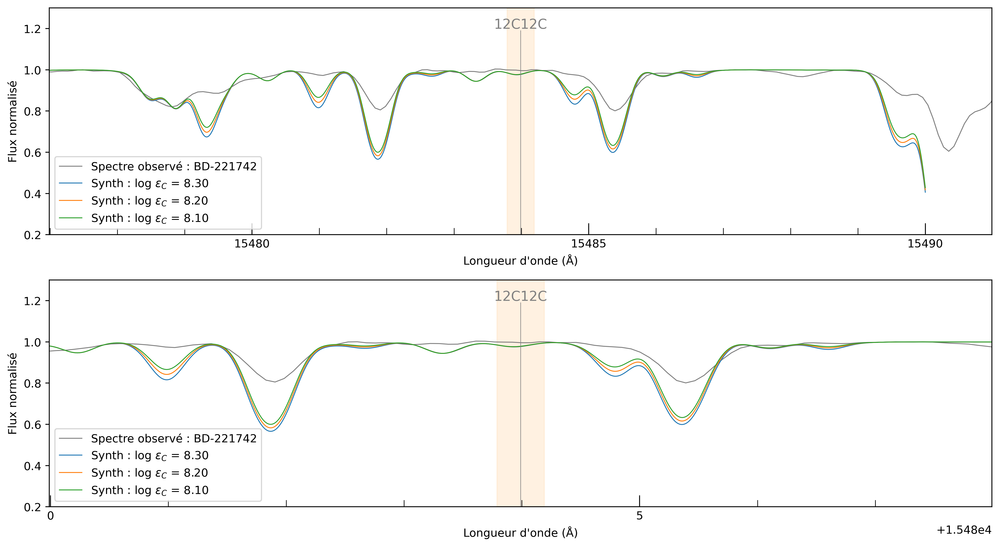

In [156]:
zoom_lines_analyse_ABU_zoom(path, synthetics_ABU,ABU, stardata, "h", 15483.99, "12C12C", 0.2)
chi_MAC(path, synthetics_ABU,ABU, stardata, "h", 15483.99, 0.8)

Chi-carré pour le spectre synthétique de MACTURB 8.30 : 8.433444792420904
Chi-carré pour le spectre synthétique de MACTURB 8.20 : 8.602835693191476
Chi-carré pour le spectre synthétique de MACTURB 8.10 : 8.729468025710515


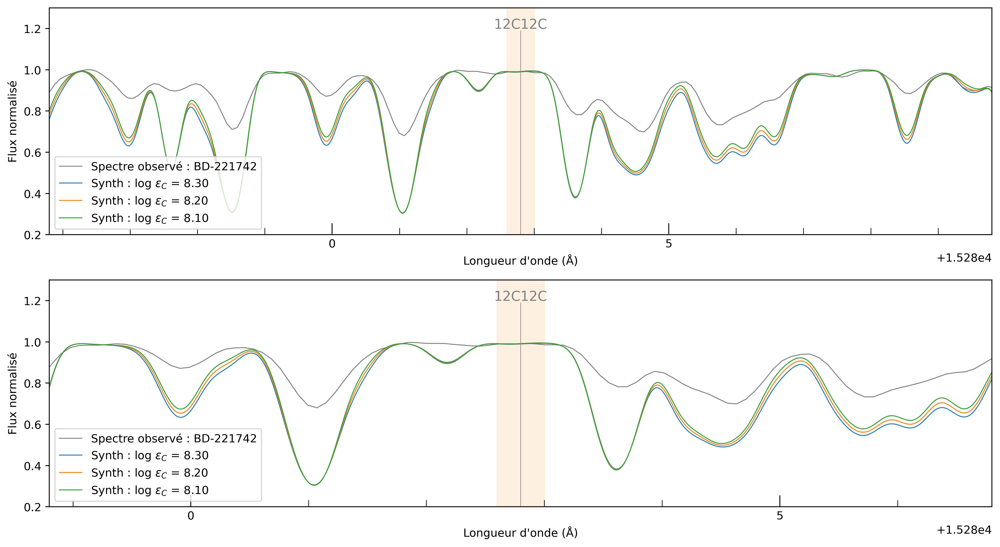

In [148]:
zoom_lines_analyse_ABU_zoom(path, synthetics_ABU,ABU, stardata, "h", 15282.8, "12C12C", 0.2)
chi_MAC(path, synthetics_ABU,ABU, stardata, "h", 15282.8, 0.8)

Chi-carré pour le spectre synthétique de MACTURB 9.15 : 8.740380126464899
Chi-carré pour le spectre synthétique de MACTURB 8.50 : 6.120348123030858
Chi-carré pour le spectre synthétique de MACTURB 8.10 : 5.081151955160761
Chi-carré pour le spectre synthétique de MACTURB 8.00 : 4.9593713978607
Chi-carré pour le spectre synthétique de MACTURB 7.80 : 4.85313528904217


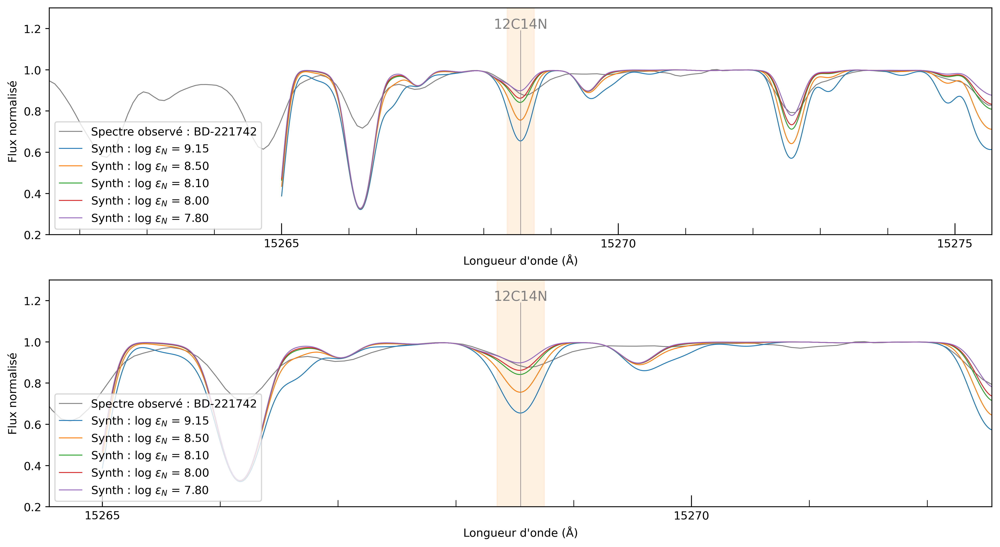

In [189]:
zoom_lines_analyse_ABU_zoom(path, synthetics_ABU,ABU, stardata, "h", 15268.55, "12C14N", 0.2)
chi_MAC(path, synthetics_ABU,ABU, stardata, "h", 15268.55, 0.8)

# MACROTURBULENCE

Dans cette section, nous déterminons la macroturbulence.

In [76]:
def zoom_lines_analyse_MARC(path, synthetics, MAC, stardata, m, k, i, taille, j):
    normal = normalisation(redshift_wavelen(stardata.get("wavelen_" + m), stardata.get("v")),stardata.get("flux_" + m),k)

    f = plt.figure(figsize=(15,8), dpi=600)
    gs = f.add_gridspec(2, hspace=0.15)
    ax = gs.subplots(sharex=False, sharey=True)

    ax[0].set_xlim(k-10,k+10)
    ax[1].set_xlim(k-5,k+5)

    for ax_ in ax:
        ax_.plot(normal['z_wavelen'], normal['flux_normalised'], linewidth=0.8, color='black', label="Observé : " + stardata.get("starname"))

        for synth in range(len(synthetics)): 
            AX2 = syntspec(path+synthetics[synth])
            ax_.plot(AX2['wavelen'], AX2['flux'], label="Synth : MACTURB "+ MAC[synth], linewidth=0.8)
        
        ax_.xaxis.set_major_locator(MultipleLocator(5))
        ax_.xaxis.set_minor_locator(MultipleLocator(1))
        ax_.xaxis.set_tick_params(direction='in', length=10, which='major')
        ax_.xaxis.set_tick_params(direction='in', length=6, which='minor')
        ax_.set_ylim(0.2, 1.3)
        ax_.tick_params(axis='both', labelsize=14)
        ax_.axvline(x=k, ymin=0., ymax=0.8, color='black', linewidth=0.5)
        ax_.text(k, 1.15, s=i, color='black', fontsize=12, ha='center')
        ax_.axvspan(k-taille, k+taille, color='bisque', alpha=0.5)

    f.text(0.075, 0.5, 'Flux normalisé', va='center', rotation='vertical', fontsize=14)
    f.text(0.45, 0.04, "Longueur d'onde (Å)", va='center', fontsize=14)

    # Ajouter la légende uniquement sur le plot du bas
    ax[-1].legend(fontsize=12)

    plt.savefig("/Users/margauxvandererven/Documents/unif2023-2024/spectre_IR/rapport/figures/MACTURB_"+j, bbox_inches="tight", pad_inches=0.1)
    plt.show()

In [74]:
MAC = ["13.00",
       "12.00","11.00", "10.00"
       ] #le nom du plot
synthetics_MAC = ["MAC-13.00"
                  ,"MAC-12.00","MAC-11.00", "MAC-10.00"
                  ] #le nom du fichier

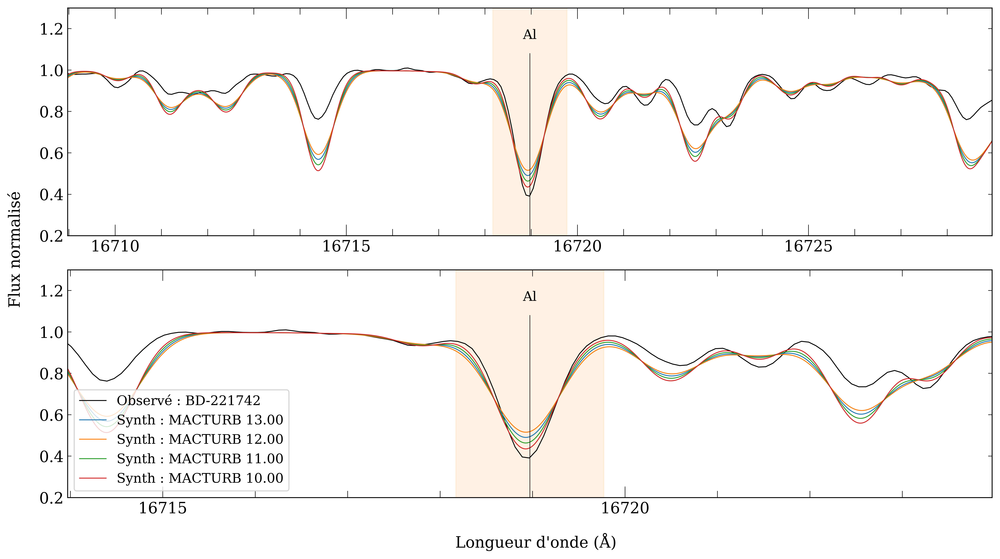

Chi-carré pour le spectre synthétique de MACTURB 13.00 : 22.267759795519474
Chi-carré pour le spectre synthétique de MACTURB 12.00 : 20.83587908668977
Chi-carré pour le spectre synthétique de MACTURB 11.00 : 23.865997242780594
Chi-carré pour le spectre synthétique de MACTURB 10.00 : 25.63416217162974


In [77]:
zoom_lines_analyse_MARC(path, synthetics_MAC,MAC, stardata, "h", 16718.97, "Al", 0.8, "Al")
chi_MAC(path, synthetics_MAC,MAC, stardata, "h", 16718.97, 0.8)

In [52]:
MAC = ["13.00","12.00","11.00", "10.00"]  #le nom du plot
synthetics_MAC = ["Na_MAC-13.00","Na_MAC-12.00","Na_MAC-11.00", "Na_MAC-10.00"] #le nom du fichier

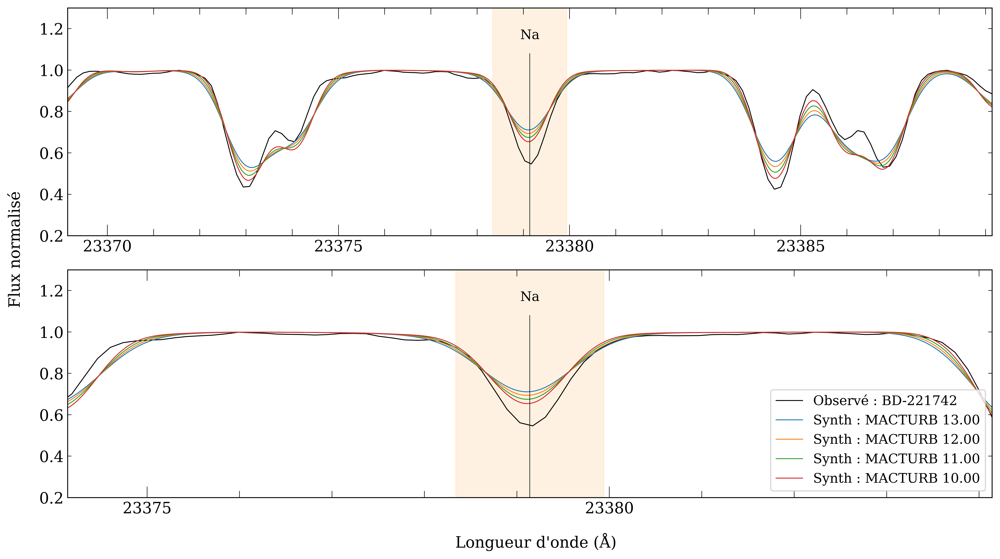

Chi-carré pour le spectre synthétique de MACTURB 13.00 : 15.013061394023392
Chi-carré pour le spectre synthétique de MACTURB 12.00 : 15.54618960401388
Chi-carré pour le spectre synthétique de MACTURB 11.00 : 16.19816510114627
Chi-carré pour le spectre synthétique de MACTURB 10.00 : 16.988075576106255


In [53]:
zoom_lines_analyse_MARC(path, synthetics_MAC,MAC, stardata_K, "k", 23379.14, "Na", 0.8)
chi_MAC(path, synthetics_MAC,MAC, stardata_K, "k", 23379.14, 0.8)

In [61]:
MAC = ["13.00","12.00","11.00", "10.00"]#le nom du plot
synthetics_MAC = ["MAC-Al-13.00","MAC-Al-12.00","MAC-Al-11.00", "MAC-Al-10.00"] #le nom du fichier

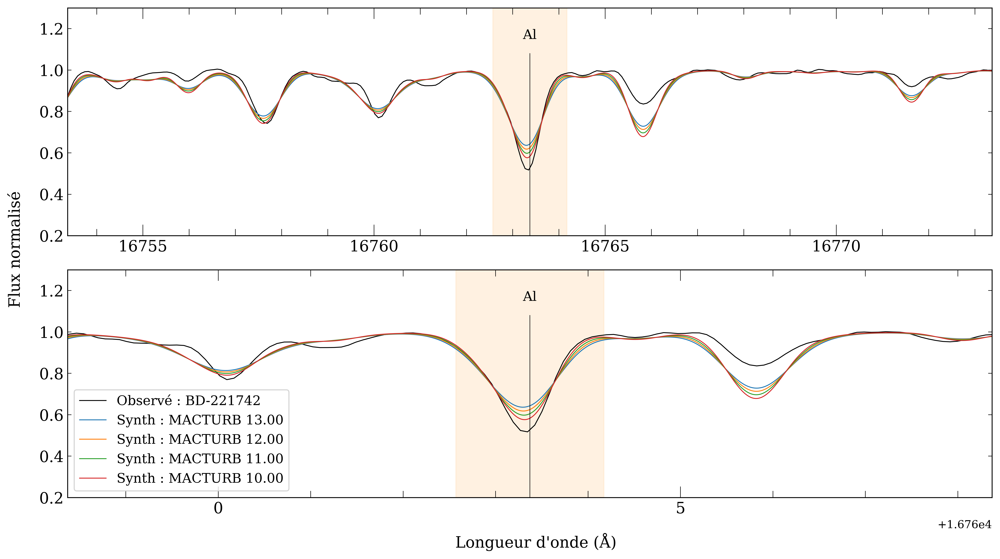

Chi-carré pour le spectre synthétique de MACTURB 13.00 : 12.148981510282365
Chi-carré pour le spectre synthétique de MACTURB 12.00 : 12.87586929780623
Chi-carré pour le spectre synthétique de MACTURB 11.00 : 13.665998829439921
Chi-carré pour le spectre synthétique de MACTURB 10.00 : 14.522154417586904


In [62]:
zoom_lines_analyse_MARC(path, synthetics_MAC,MAC, stardata, "h", 16763.37, "Al", 0.8, "2Al")
chi_MAC(path, synthetics_MAC,MAC, stardata, "h", 16763.37, 0.8)

In [69]:
MAC = ["13.00","12.00","11.00", "10.00"]#le nom du plot
synthetics_MAC = ["MAC-Mg-13.00","MAC-Mg-12.00","MAC-Mg-11.00", "MAC-Mg-10.00"] #le nom du fichier

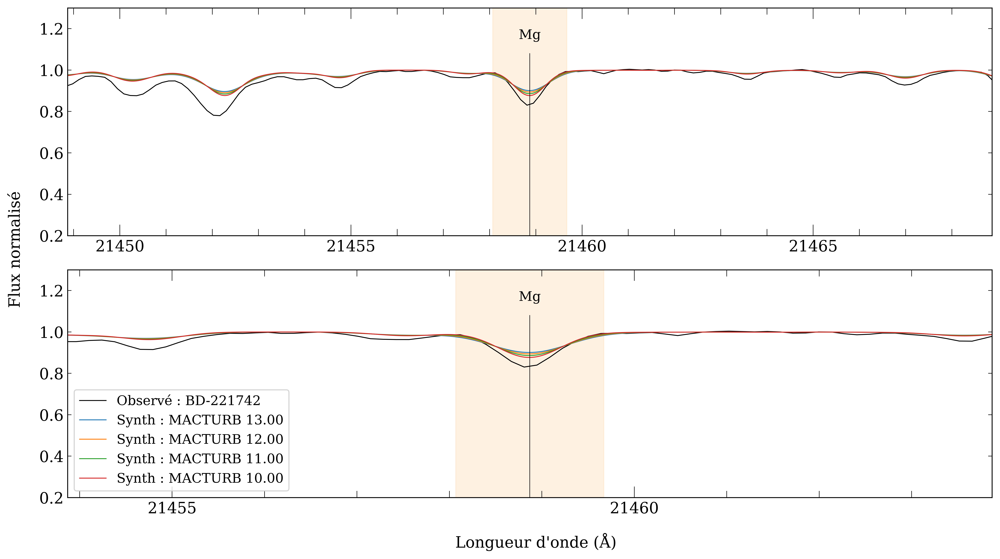

Chi-carré pour le spectre synthétique de MACTURB 13.00 : 0.8647067684744271
Chi-carré pour le spectre synthétique de MACTURB 12.00 : 0.938783885086071
Chi-carré pour le spectre synthétique de MACTURB 11.00 : 1.0300542883962076
Chi-carré pour le spectre synthétique de MACTURB 10.00 : 1.1428083057161889


In [72]:
zoom_lines_analyse_MARC(path, synthetics_MAC,MAC, stardata_K, "k", 21458.87, "Mg", 0.8, "Mg")
chi_MAC(path, synthetics_MAC,MAC, stardata_K, "k", 21458.87, 0.8)